In [1]:
import pandas as pd
import numpy as np
from pandas import json_normalize
import json
from datetime import datetime
import pytz
import matplotlib.pyplot as plt
import ruptures as rpt
from collections import Counter

In [2]:
columns = ['sensors.battery.temp',
       'sensors.battery.percent', 'sensors.battery.solarmv',
       'sensors.battery.current', 'sensors.battery.voltage',
       'sensors.battery.solarma', 'sensors.battery.charging',
        'solar_power', 'battery_power','power_difference']

In [3]:
# Reading back and setting the MultiIndex
labelled_data = pd.read_feather('MTDataBatch1\Labelled Data\Labelled Batch 1 - Updated.feather')
labelled_data.set_index(['DeviceId', 'time'], inplace=True)
labelled_data

Id  \
DeviceId        time                                   
015262001277846 2021-04-21 03:18:26+10:00      10046   
                2021-04-21 03:17:52+10:00      10049   
                2021-04-21 03:27:29+10:00      15189   
                2021-04-21 03:28:29+10:00      15190   
                2021-04-21 03:21:30+10:00      15191   
...                                              ...   
015262001276442 2021-11-22 13:01:23+11:00  195389569   
                2021-11-22 13:04:17+11:00  195391320   
                2021-11-23 13:05:02+11:00  196545125   
                2021-11-24 13:05:36+11:00  197957676   
                2021-11-24 13:05:02+11:00  197957683   

                                                                    CreatedAt  \
DeviceId        time                                                            
015262001277846 2021-04-21 03:18:26+10:00  2021-04-20 17:18:57.3601057 +00:00   
                2021-04-21 03:17:52+10:00  2021-04-20 17:18:57.9206698 +00:00   
                2021-04-21 03:27:29+10:00  2021-04-20 17:30:00.0973275 +00:00   
                2021-04-21 03:28:29+10:00  2021-04-20 17:30:00.5204188 +00:00   
                2021-04-21 03:21:30+10:00  2021-04-20 17:30:00.6604193 +00:00   
...                                                                       ...   
015262001276442 2021-11-22 13:01:23+11:00  2021-11-22 02:02:07.3194074 +00:00   
                2021-11-22 13:04:17+11:00  2021-11-22 02:04:57.8307232 +00:00   
                2021-11-23 13:05:02+11:00  2021-11-23 02:05:44.6179891 +00:00   
                2021-11-24 13:05:36+11:00  2021-11-24 02:06:18.7314233 +00:00   
                2021-11-24 13:05:02+11:00  2021-11-24 02:06:19.3460223 +00:00   

                                                                    UpdatedAt  \
DeviceId        time                                                            
015262001277846 2021-04-21 03:18:26+10:00  2021-04-20 17:18:57.4751133 +00:00   
                2021-04-21 03:17:52+10:00  2021-04-20 17:18:58.0006530 +00:00   
                2021-04-21 03:27:29+10:00  2021-04-20 17:30:00.1973672 +00:00   
                2021-04-21 03:28:29+10:00  2021-04-20 17:30:00.6554035 +00:00   
                2021-04-21 03:21:30+10:00  2021-04-20 17:30:00.7254268 +00:00   
...                                                                       ...   
015262001276442 2021-11-22 13:01:23+11:00  2021-11-22 02:02:07.4609948 +00:00   
                2021-11-22 13:04:17+11:00  2021-11-22 02:04:57.9257593 +00:00   
                2021-11-23 13:05:02+11:00  2021-11-23 02:05:44.7707739 +00:00   
                2021-11-24 13:05:36+11:00  2021-11-24 02:06:18.8826478 +00:00   
                2021-11-24 13:05:02+11:00  2021-11-24 02:06:19.4060168 +00:00   

                                          State             timeStamp  \
DeviceId        time                                                    
015262001277846 2021-04-21 03:18:26+10:00     1  2021-04-20T17:18:26Z   
                2021-04-21 03:17:52+10:00     1  2021-04-20T17:17:52Z   
                2021-04-21 03:27:29+10:00     1  2021-04-20T17:27:29Z   
                2021-04-21 03:28:29+10:00     1  2021-04-20T17:28:29Z   
                2021-04-21 03:21:30+10:00     1  2021-04-20T17:21:30Z   
...                                         ...                   ...   
015262001276442 2021-11-22 13:01:23+11:00     1  2021-11-22T02:01:23Z   
                2021-11-22 13:04:17+11:00     1  2021-11-22T02:04:17Z   
                2021-11-23 13:05:02+11:00     1  2021-11-23T02:05:02Z   
                2021-11-24 13:05:36+11:00     1  2021-11-24T02:05:36Z   
                2021-11-24 13:05:02+11:00     1  2021-11-24T02:05:02Z   

                                             event  sensors.battery.extpower  \
DeviceId        time                                                           
015262001277846 2021-04-21 03:18:26+10:00   moving                     False   
                2021-04

In [4]:
devices = set(labelled_data.index.get_level_values('DeviceId'))

In [5]:
devices

{'015262001090339',
 '015262001105328',
 '015262001228161',
 '015262001249910',
 '015262001258648',
 '015262001261600',
 '015262001261642',
 '015262001265908',
 '015262001268480',
 '015262001268894',
 '015262001274207',
 '015262001274561',
 '015262001275022',
 '015262001275139',
 '015262001275493',
 '015262001276244',
 '015262001276418',
 '015262001276434',
 '015262001276442',
 '015262001276475',
 '015262001276483',
 '015262001277440',
 '015262001277507',
 '015262001277556',
 '015262001277564',
 '015262001277846',
 '015262001277994',
 '015262001278075',
 '015262001278133',
 '015262001278315',
 '015262001278323',
 '015262001278372',
 '015262001278422',
 '015262001278513',
 '015262001281806'}

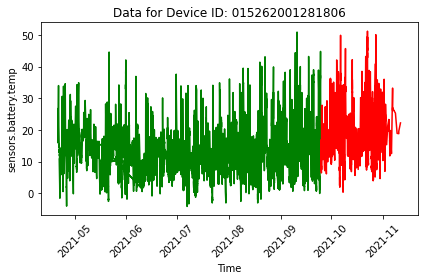

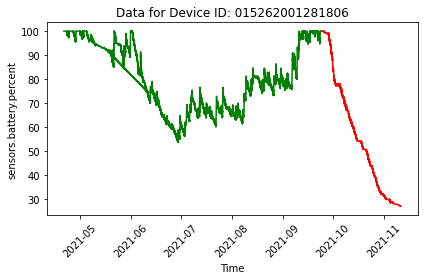

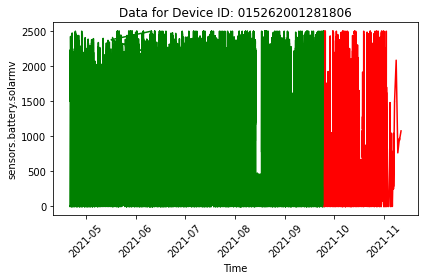

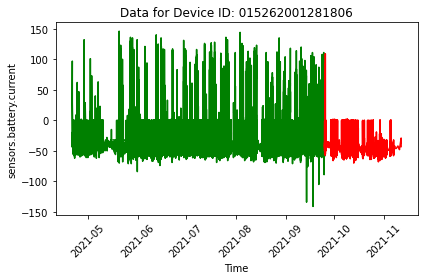

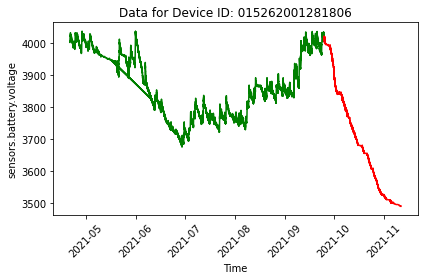

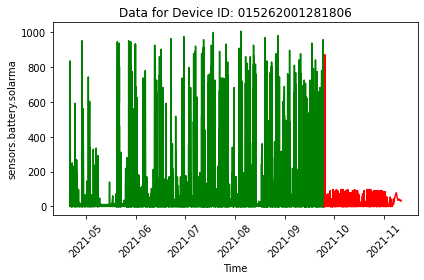

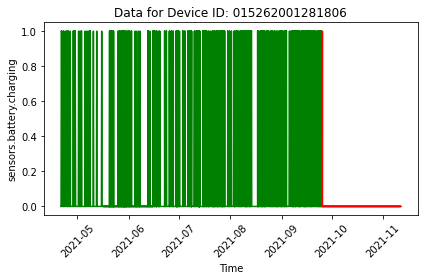

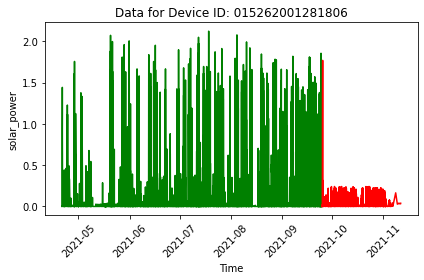

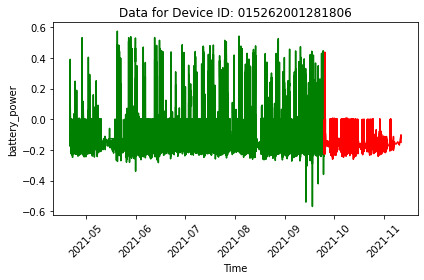

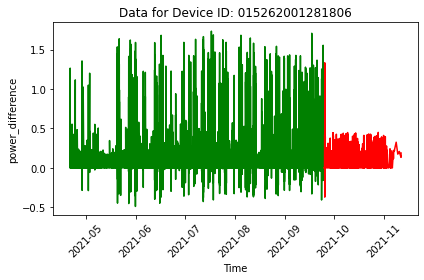

In [6]:
import matplotlib
deviceId = '015262001281806'
for column in columns:
    colors = np.where(labelled_data.loc[deviceId]['isDeviceWorking'], 'green', 'red')
    fig, ax = plt.subplots()
    current_color = colors[0]
    start_index = 0
    for i in range(1, len(colors)):
        if colors[i] != current_color or i == len(colors) - 1:
            ax.plot(labelled_data.loc[deviceId].index.get_level_values('time')[start_index:i+1], 
                    labelled_data.loc[deviceId][column][start_index:i+1], 
                    color=current_color, label=column)
            start_index = i
            current_color = colors[i]

    plt.xlabel('Time')
    plt.ylabel(column)
    plt.title('Data for Device ID: '+deviceId)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [7]:
import os
print(os.getcwd())

D:\UniMelb\Sem 3\4 Data


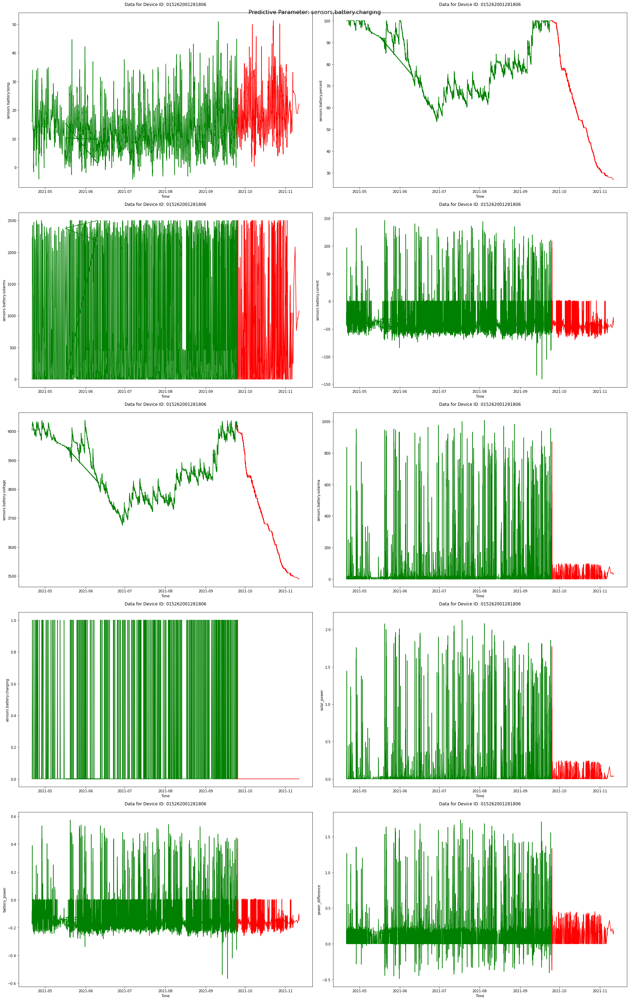

In [8]:
deviceId = '015262001281806'
predictive_parameter_list = labelled_data.loc[(labelled_data.index.get_level_values('DeviceId') == deviceId)
                                          & (labelled_data['isDeviceWorking'] == False),'predictive_parameter'].values
predictive_parameter = "None"
if len(predictive_parameter_list) > 0:
    predictive_parameter = predictive_parameter_list[0]
figure, axes = plt.subplots(5,2,figsize=(25,40))
figure.suptitle("Predictive Parameter: "+predictive_parameter, fontsize=16)

# Flatten the axes array for easy iteration
axes = axes.flatten()
for i, ax in enumerate(axes):
#     for column in columns:
    column = columns[i]
    colors = np.where(labelled_data.loc[deviceId]['isDeviceWorking'], 'green', 'red')
#     figure,axis = plt.subplots()
    current_color = colors[0]
    start_index = 0
    for i in range(1, len(colors)):
        if colors[i] != current_color or i == len(colors) - 1:
            ax.plot(labelled_data.loc[deviceId].index.get_level_values('time')[start_index:i+1], 
                    labelled_data.loc[deviceId][column][start_index:i+1], 
                    color=current_color, label=column)
            start_index = i
            current_color = colors[i]

    ax.set_xlabel('Time')
    ax.set_ylabel(column)
    ax.set_title('Data for Device ID: '+deviceId,pad=20)
plt.tight_layout()
# plt.show()
output_path = "D:\\UniMelb\\Sem 3\\4 Data\\MTDataBatch1\\Labelled Data\\Images\\For Thesis.png"
plt.savefig(output_path,facecolor='white', transparent=False,dpi=600)

C:\Users\safna\AppData\Local\Temp\ipykernel_10344\1474199321.py:8: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  figure, axes = plt.subplots(2,5,figsize=(35,15))


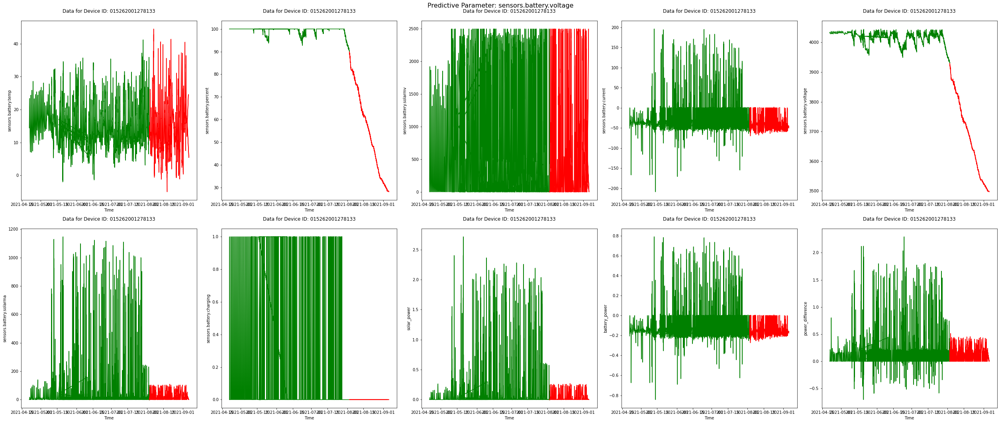

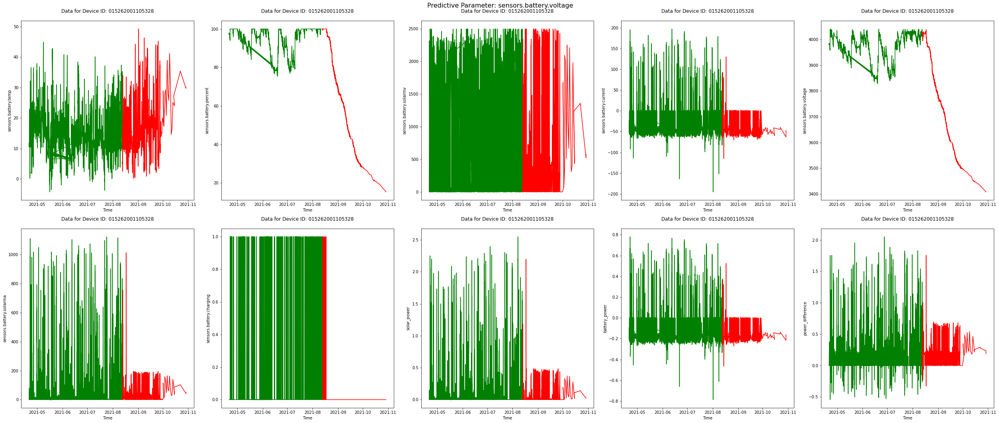

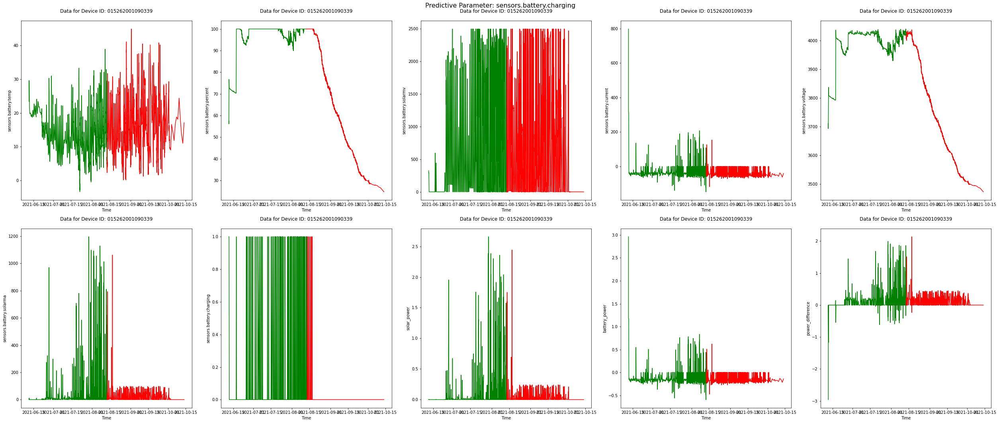

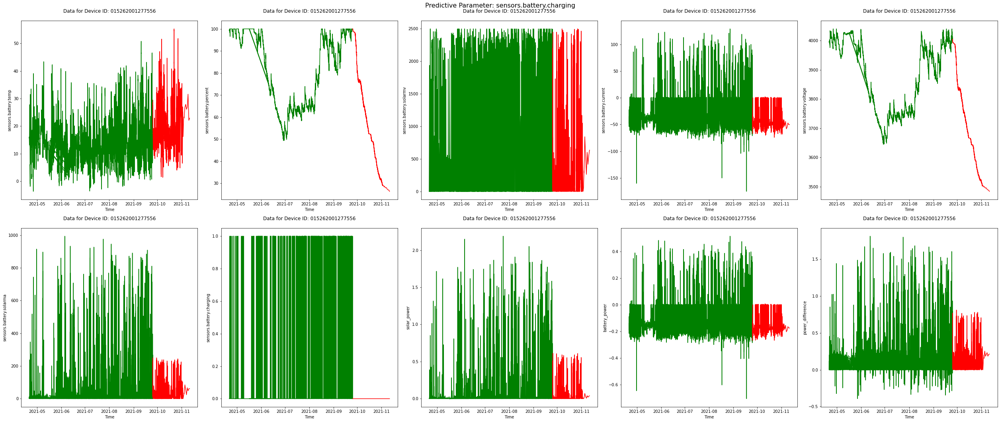

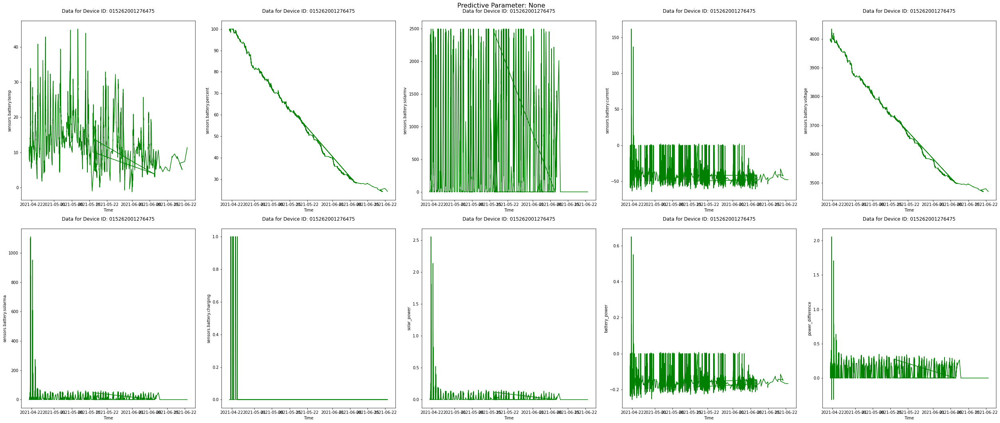

...

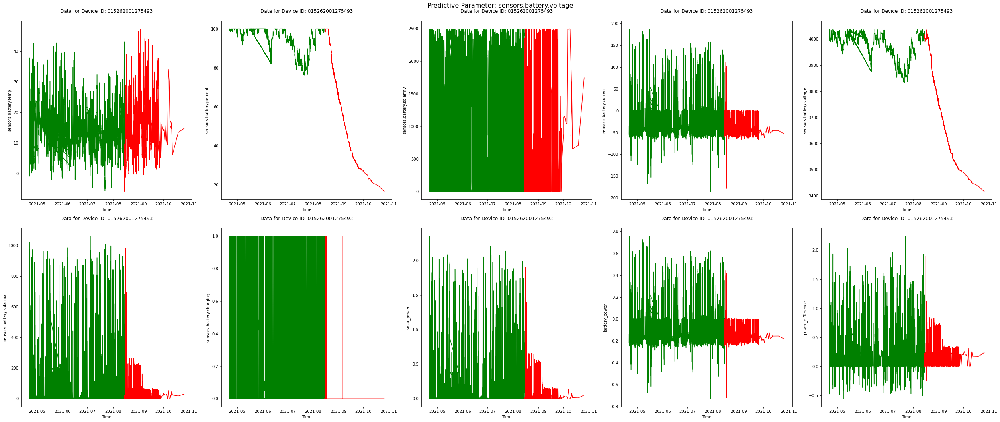

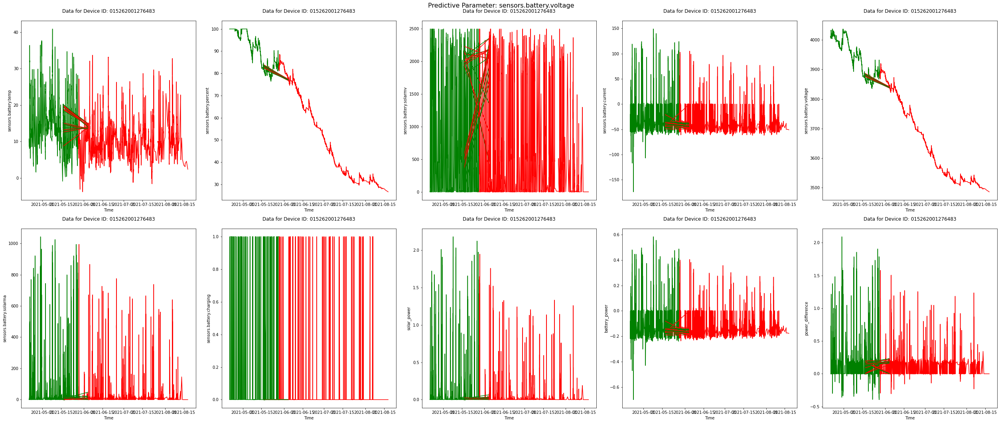

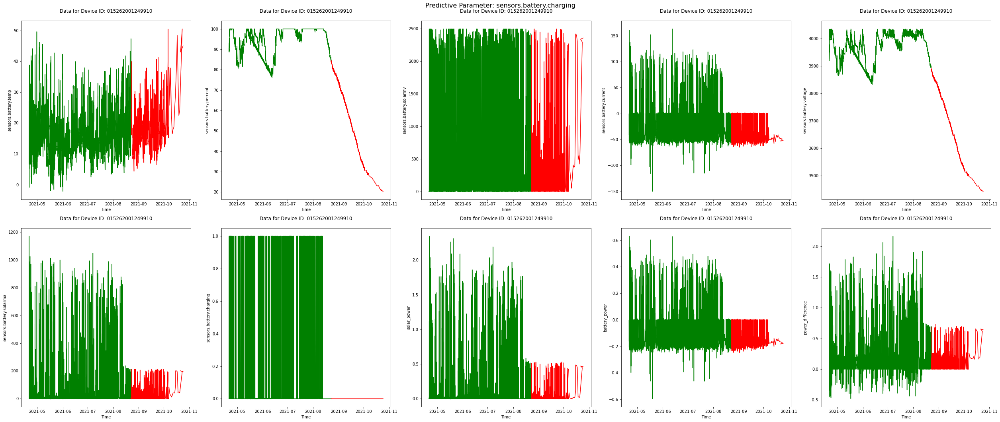

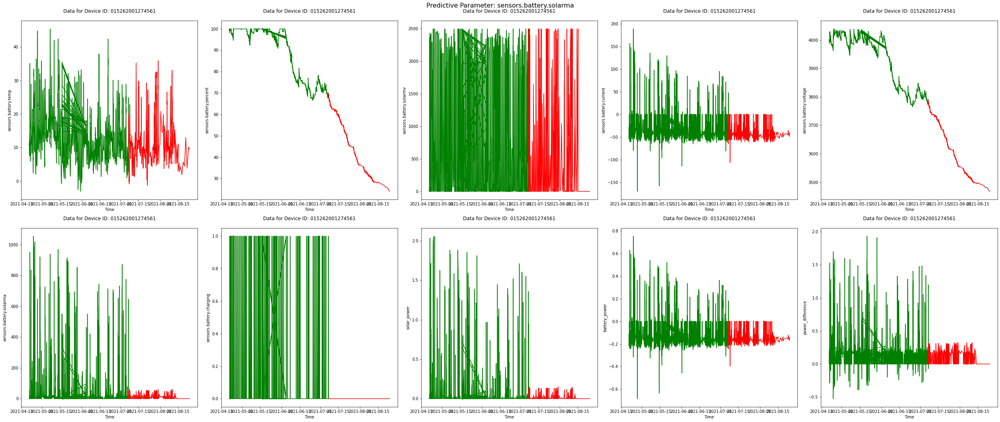

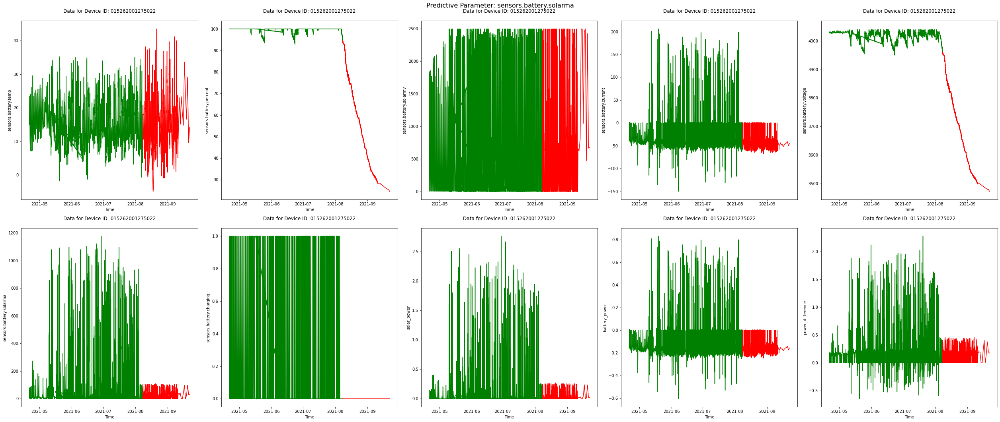

In [68]:
# Save the graphs for all devices, as one image per device
for deviceId in devices:
    predictive_parameter_list = labelled_data.loc[(labelled_data.index.get_level_values('DeviceId') == deviceId)
                                          & (labelled_data['isDeviceWorking'] == False),'predictive_parameter'].values
    predictive_parameter = "None"
    if len(predictive_parameter_list) > 0:
        predictive_parameter = predictive_parameter_list[0]
    figure, axes = plt.subplots(2,5,figsize=(35,15))
    figure.suptitle("Predictive Parameter: "+predictive_parameter, fontsize=16)

    # Flatten the axes array for easy iteration
    axes = axes.flatten()
    for i, ax in enumerate(axes):
    #     for column in columns:
        column = columns[i]
        colors = np.where(labelled_data.loc[deviceId]['isDeviceWorking'], 'green', 'red')
    #     figure,axis = plt.subplots()
        current_color = colors[0]
        start_index = 0
        for i in range(1, len(colors)):
            if colors[i] != current_color or i == len(colors) - 1:
                ax.plot(labelled_data.loc[deviceId].index.get_level_values('time')[start_index:i+1], 
                        labelled_data.loc[deviceId][column][start_index:i+1], 
                        color=current_color, label=column)
                start_index = i
                current_color = colors[i]

        ax.set_xlabel('Time')
        ax.set_ylabel(column)
        ax.set_title('Data for Device ID: '+deviceId,pad=20)
    plt.tight_layout()
    # plt.show()
    output_path = "D:\\UniMelb\\Sem 3\\4 Data\\MTDataBatch1\\Labelled Data\\Images\\" + deviceId+ ".png"
    plt.savefig(output_path,facecolor='white', transparent=False,dpi=600)